In [1]:
import numpy as np
import matplotlib.pyplot as plt

from astropy.io import fits  
from astropy.wcs import WCS

from utils_viz.data_utils import *


In [2]:
PATH_COHRS = "future_data/COHRS_10p50_0p00_CUBE_3T2_R2.fit"
PATH_COHRS_INTEG = "future_data/COHRS_10p50_0p00_INTEG_R2.fit"
PATH_COHRS_LV = "future_data/COHRS_10p50_0p00_LV_R2.fit"

PATH_SPINE = "future_data/reproject_spines.fits"

In [3]:
data_cohrs = fits.open(PATH_COHRS)
data_cohrs_integ = fits.open(PATH_COHRS_INTEG)
data_cohrs_lv = fits.open(PATH_COHRS_LV)

data_s2 = fits.open(PATH_SPINE)

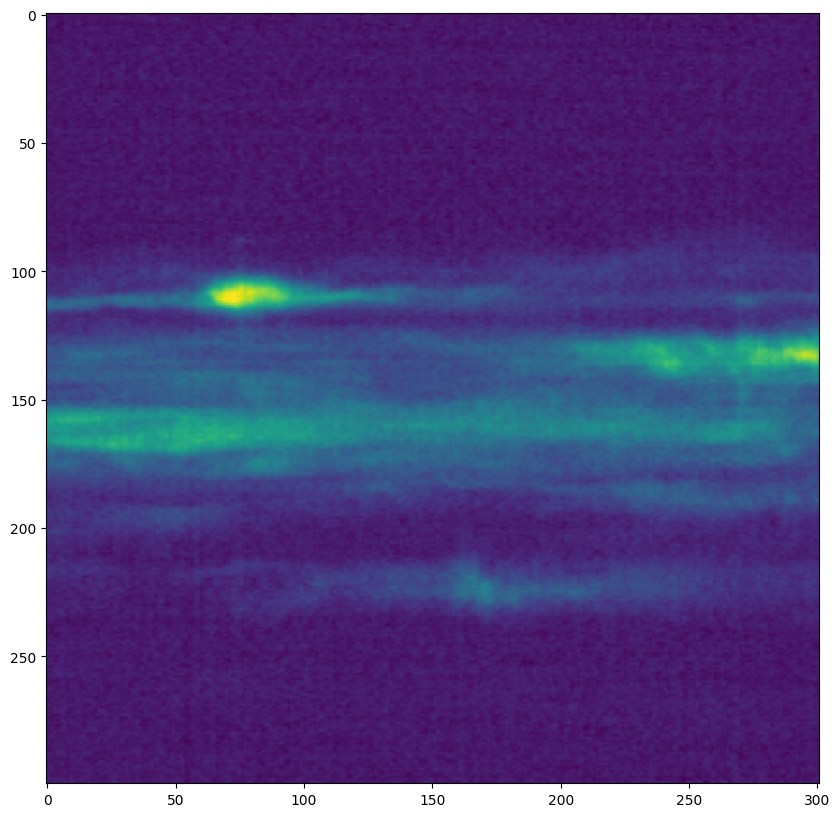

In [4]:
plt.figure(figsize=(10, 10))
plt.imshow(data_cohrs_lv[0].data[200:500])
plt.show()

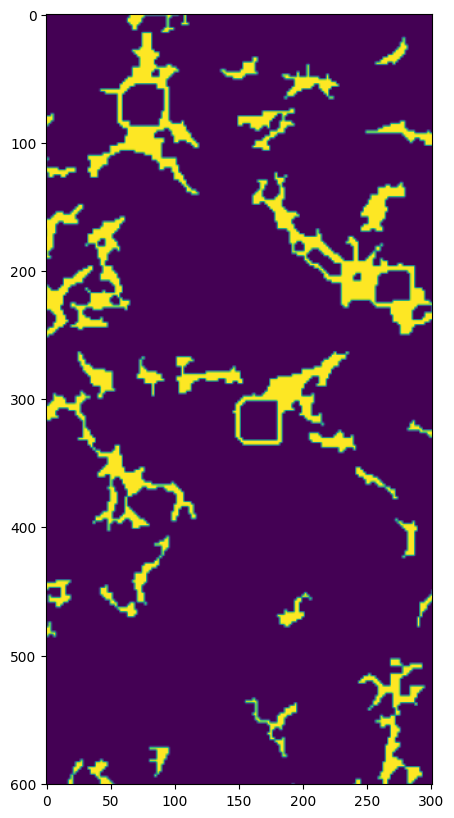

In [5]:
plt.figure(figsize=(10, 10))
plt.imshow(data_s2[0].data[0])
plt.show()

# Select filament

In [6]:
y_min, y_max = 260, 300 
x_min, x_max = 60, 100  

In [7]:
y_min, y_max = 120, 172 
x_min, x_max = 220, 300  

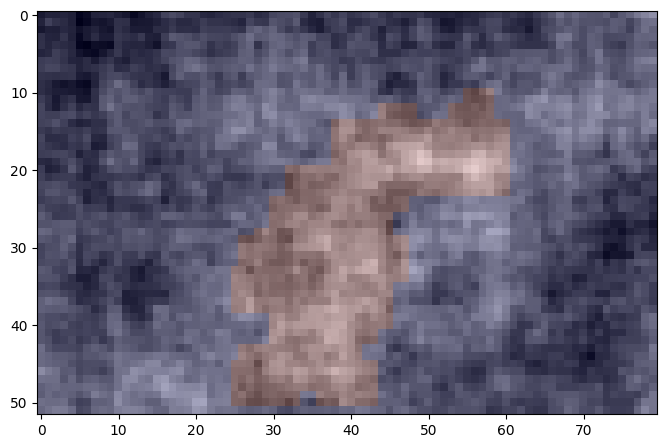

In [8]:
color_image2 = data_cohrs_integ[0].data
mask = data_s2[0].data[0].astype(bool)  

cropped_color_image2 = color_image2[y_min:y_max, x_min:x_max]
cropped_mask = mask[y_min:y_max, x_min:x_max]

plt.figure(figsize=(8, 8))
plt.imshow(cropped_color_image2, cmap='gray')  
plt.imshow(cropped_mask, cmap='jet', alpha=0.2)  
plt.show()

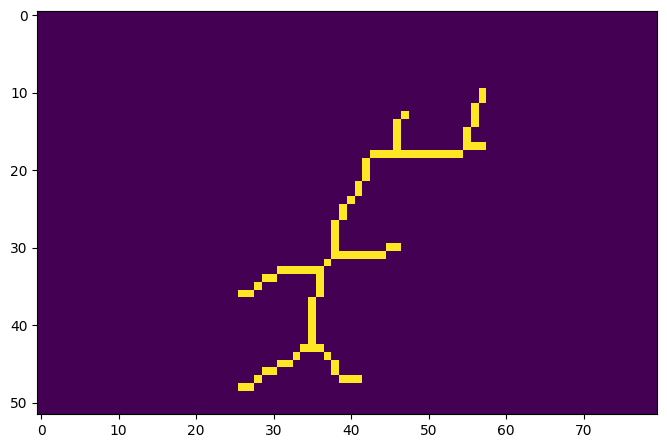

In [9]:
import skimage.morphology as morph
skeleton = morph.skeletonize(cropped_mask)
plt.figure(figsize=(8, 8))
plt.imshow(skeleton)  
plt.show()

# Study the filament

Tout pic qui a une longueur de sous pic de moins de x valeurs => bye

In [10]:
threshold = 2
min_len_souspic = 5

In [11]:
from utils_viz.noise import smooth_signal


header = data_cohrs[0].header

y_coords, x_coords = np.where(skeleton == 1)

points = list(zip(x_coords, y_coords))
multiplied_points_y_x = []
multiplied_points_y_x_z_v = []
l_speed = []

for i, (x, y) in enumerate(points):
    smoothed_signal = smooth_signal(data_cohrs[0].data[:, y_min:y_max, x_min:x_max][:, y, x], noisethr=0.95)

    sub_pic = []
    for idx, s in enumerate(smoothed_signal):
        if len(sub_pic)>0 and abs(convert_to_kms(header["CRPIX3"], header["CDELT3"], header["CRVAL3"], header["NAXIS3"], min(sub_pic)) - convert_to_kms(header["CRPIX3"], header["CDELT3"], header["CRVAL3"], header["NAXIS3"], idx)) >= 10:
            #print(abs(convert_to_kms(header["CRPIX3"], header["CDELT3"], header["CRVAL3"], header["NAXIS3"], min(sub_pic)) - convert_to_kms(header["CRPIX3"], header["CDELT3"], header["CRVAL3"], header["NAXIS3"], idx)))
            #ici
            if len(sub_pic) >= min_len_souspic :
                l_speed.append([convert_to_kms(header["CRPIX3"], header["CDELT3"], header["CRVAL3"], header["NAXIS3"], s) for s in sub_pic])
                multiplied_points_y_x.append((y,x))
                multiplied_points_y_x_z_v.extend([(y, x, z, convert_to_kms(header["CRPIX3"], header["CDELT3"], header["CRVAL3"], header["NAXIS3"], z)) for z in sub_pic])
            
            sub_pic = []
            #break
        elif s < threshold and len(sub_pic)>0:
            #ici
            if len(sub_pic) >= min_len_souspic :
                multiplied_points_y_x.append((y,x))
                l_speed.append([convert_to_kms(header["CRPIX3"], header["CDELT3"], header["CRVAL3"], header["NAXIS3"], s) for s in sub_pic])
                multiplied_points_y_x_z_v.extend([(y, x, z, convert_to_kms(header["CRPIX3"], header["CDELT3"], header["CRVAL3"], header["NAXIS3"], z)) for z in sub_pic])
                 
            sub_pic = []
            
        elif s > threshold :
            sub_pic.append(idx)

In [12]:
len(points)

86

In [13]:
len(multiplied_points_y_x)

131

In [14]:
len(multiplied_points_y_x_z_v)

1233

y c'est le long de l'axe à 601
x le long du 301

donc on prendra le deuxieme du tuple

In [15]:
y = [item[0] for item in multiplied_points_y_x_z_v]
x = [item[1] for item in multiplied_points_y_x_z_v]
z = [item[2] for item in multiplied_points_y_x_z_v]

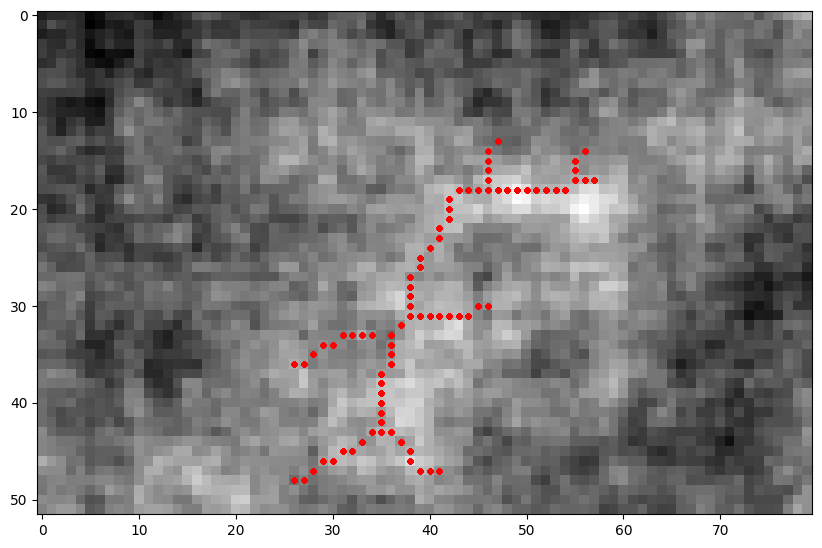

In [16]:
plt.figure(figsize=(10, 10))
plt.imshow(data_cohrs_integ[0].data[y_min:y_max, x_min:x_max], cmap='gray')  
plt.scatter(x, y, c='red', s=10)  # c='red' for red points, s=50 for size
plt.show()

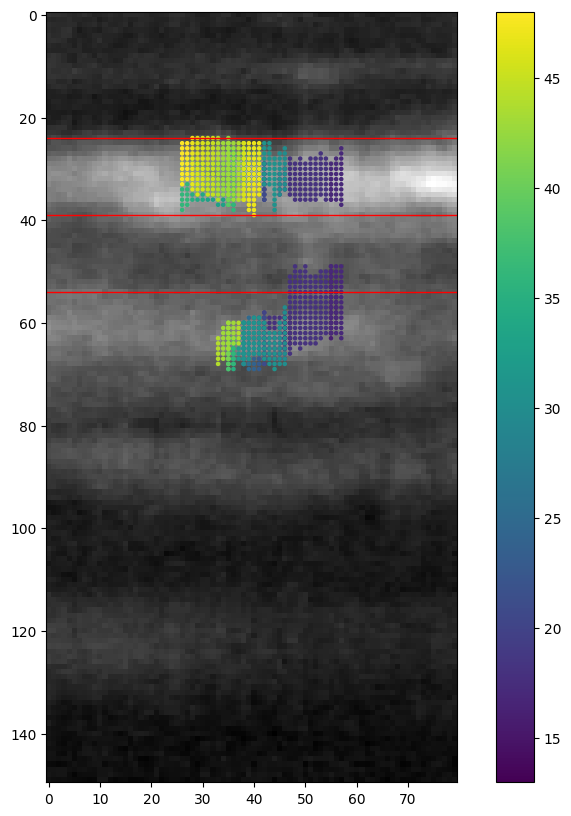

In [17]:
import math
zmin, zmax = 300, 450
z_sample = [zi - zmin for zi in z]

plt.figure(figsize=(10, 10))
plt.imshow(data_cohrs_lv[0].data[zmin:zmax, x_min:x_max], cmap='gray')  
plt.scatter(x, z_sample, c=y, s=5)

for i in range(math.floor(min(z_sample)), math.ceil(max(z_sample)), math.floor(10 * 1/header["CDELT3"])):
    plt.axhline(y=i, color='red', linestyle='-', linewidth=1)
    
plt.colorbar()
plt.show()

# Matrix distance

In [18]:
def distance(p1, p2):
    x1, y1, z1, v1 = p1
    x2, y2, z2, v2 = p2
    
    return math.sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2 + (z1 - z2) ** 2) + math.exp((v1 - v2) - 10)

In [19]:
n_points = len(multiplied_points_y_x_z_v)

distance_matrix_loris = np.zeros((n_points, n_points))

for i in range(n_points):
    for j in range(i + 1, n_points):  
        p1 = multiplied_points_y_x_z_v[i]
        p2 = multiplied_points_y_x_z_v[j]
        d = distance(p1, p2)
        distance_matrix_loris[i,j] = d
        distance_matrix_loris[j,i] = d

In [20]:
from sklearn.cluster import AgglomerativeClustering

clustering_model = AgglomerativeClustering(n_clusters=3, metric='precomputed', linkage='complete')
labels = clustering_model.fit_predict(distance_matrix_loris)

# Plot 3D

In [21]:
import plotly.express as px
import numpy as np
import pandas as pd
import plotly.graph_objects as go

In [22]:
# Create a DataFrame
data = pd.DataFrame({'x': x, 'y': y, 'z': z, 'label': labels})

# Plotly 3D scatter plot
fig = px.scatter_3d(
    data,
    x='x',
    y='y',
    z='z',
    color='label',
    title="Interactive 3D Scatter Plot"
)
fig.update_traces(marker=dict(size=5))  

z_min = math.floor(min(z))
z_max = math.ceil(max(z))
step = max(1, math.floor(10 * 1/header["CDELT3"]))  
for i in range(z_min, z_max, step):
    fig.add_trace(go.Mesh3d(
        x=[min(x), max(x), max(x), min(x)],  
        y=[min(y), min(y), max(y), max(y)],  
        z=[i, i, i, i],  
        color='red',  
        opacity=0.5
    ))


fig.update_layout(scene=dict(
    xaxis_title='X Axis',
    yaxis_title='Y Axis',
    zaxis_title='Z Axis'
))

fig.show()

# Superpose 3D

In [23]:
data_cohrs[0].data.shape

(788, 601, 301)

In [24]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px

z_min, z_max = 300, 400
x_flat, y_flat, z_flat = np.meshgrid(np.arange(x_min, x_max + 1),
                      np.arange(y_min, y_max + 1),
                      np.arange(z_min, z_max + 1))
x_flat = x_flat.flatten()
y_flat = y_flat.flatten()
z_flat = z_flat.flatten()
value = data_cohrs[0].data[z_min:z_max + 1, y_min:y_max + 1, x_min:x_max + 1].flatten()


y_points = [item[0] + y_min for item in multiplied_points_y_x_z_v]
x_points = [item[1] + x_min for item in multiplied_points_y_x_z_v]
z_points = [item[2] - 0 for item in multiplied_points_y_x_z_v]
data = pd.DataFrame({'x': x_points, 'y': y_points, 'z': z_points, 'label':labels})
scatter_fig = px.scatter_3d(
    data, x='x', y='y', z='z', color='label',
    title="Interactive 3D Scatter Plot")
scatter_fig.update_traces(marker=dict(size=5))


volume_fig = go.Figure()
volume_fig.add_trace(scatter_fig.data[0])
volume_fig.add_trace(go.Volume(
    x=x_flat,  
    y=y_flat,  
    z=z_flat,  
    value=value, 
    opacity=0.5,  
    isomin=value.min(),
    isomax=value.max(),
    colorscale="gray"))

volume_fig.show()

# Loris

In [25]:
COHRS_data = data_cohrs[0].data
COHRS_header = data_cohrs[0].header

cluster_data = np.zeros_like(COHRS_data)
for i in range (len(labels)) :
    l = labels[i]
    xi = x[i]
    yi = y[i]
    zi = z[i]
    cluster_data[zi, yi, xi] = l
fits.writeto("future_data/COHRS_clustered.fits", cluster_data, COHRS_header, overwrite=True)

In [26]:
data_c = fits.open("future_data/COHRS_clustered.fits")

In [27]:
data_c[0].data.shape

(788, 601, 301)

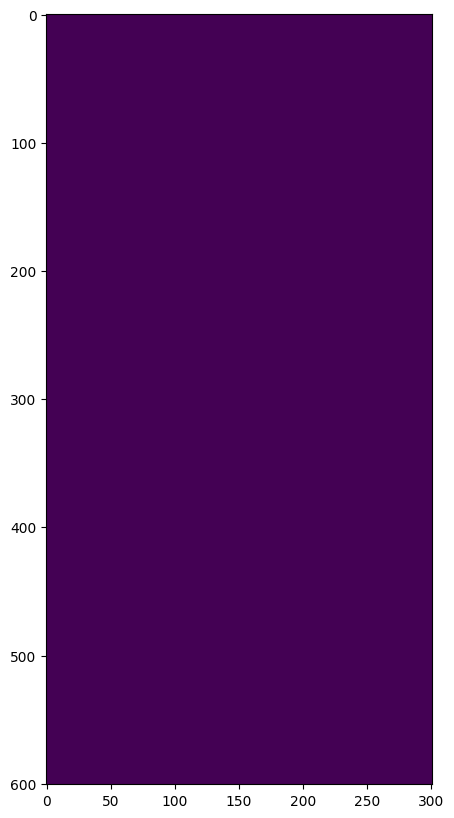

In [28]:
plt.figure(figsize=(10, 10))
plt.imshow(data_c[0].data[300])
plt.show()